# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные находятся [здесь](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` собрана информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

In [ ]:
!pip install -q  catboost keras-tuner keras_nlp

In [ ]:
!wget -q https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
!unzip -q dsplus_integrated_project_4.zip

replace to_upload/test_images.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from math import sqrt, ceil
import os
import re
import scipy
import spacy
import nltk
import time
import random
from pathlib import Path
from nltk.corpus import stopwords
nltk.download('stopwords')
import torchvision.models as models
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from torchvision import transforms
import torch
import torch.nn as nn

import re
import tensorflow as tf
import keras_nlp
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.layers import  Conv2D, Flatten, AvgPool2D, Dense, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.resnet import ResNet50
from collections import Counter

from PIL import Image

from tqdm import notebook
from tqdm.auto import tqdm

from sklearn.model_selection import GroupShuffleSplit, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.pipeline import make_pipeline
from sklearn.svm import LinearSVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, make_scorer
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor

nltk.download('wordnet') #Загружаем необходимые ресурсы для лемматезации
nltk.download('averaged_perceptron_tagger') #без эттого пакета программа не выполнялась в колабе
nltk.download('punkt')

Using TensorFlow backend


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
PATH = '/content/to_upload'

In [ ]:
STOP_WORDS = ['teenage', 'baby', 'babies', 'child',
                  'chidren', 'teenager', 'teenages', 'girl',
                  'girls', 'boy', 'boys', 'kid',
                  'kids','infant', 'youngster', 'youngsters']
SEED = 31416
np.random.seed(SEED)
tf.random.set_seed(SEED)

In [ ]:
df_train = pd.read_csv(os.path.join(PATH, 'train_dataset.csv'))
#test_queries = pd.read_csv(os.path.join(PATH, 'test_queries.csv'), error_bad_lines=False, sep='|', index_col=0)
test_queries = pd.read_csv(os.path.join(PATH, 'test_queries.csv'), on_bad_lines='skip', sep='|', index_col=0)
train_image_files = [file for file in os.listdir(os.path.join(PATH, 'train_images')) if file.endswith('.jpg')]
train_images_df = pd.DataFrame(train_image_files, columns=['train_file_name'])
test_images_df = pd.read_csv(os.path.join(PATH, 'test_images.csv'))
crowd_annotations = pd.read_csv(os.path.join(PATH, 'CrowdAnnotations.tsv'), sep='\t', header=None)
expert_annotations = pd.read_csv(os.path.join(PATH, 'ExpertAnnotations.tsv'), sep='\t', header=None)


In [ ]:
df_train.info()
df_train.describe()
df_train.head(10)



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [ ]:
test_queries.info()
test_queries.describe()
test_queries.head(10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg
5,1232148178_4f45cc3284.jpg#0,A baby girl playing at a park .,1232148178_4f45cc3284.jpg
6,1232148178_4f45cc3284.jpg#1,A closeup of a child on a playground with adul...,1232148178_4f45cc3284.jpg
7,1232148178_4f45cc3284.jpg#2,A young boy poses for a picture in front of a ...,1232148178_4f45cc3284.jpg
8,1232148178_4f45cc3284.jpg#3,A young girl is smiling in front of the camera...,1232148178_4f45cc3284.jpg
9,1232148178_4f45cc3284.jpg#4,There is a little blond hair girl with a green...,1232148178_4f45cc3284.jpg


In [ ]:
train_images_df.info()
train_images_df.describe()
train_images_df.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 1 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   train_file_name  1000 non-null   object
dtypes: object(1)
memory usage: 7.9+ KB


,train_file_name
0,2815256108_fc1302117d.jpg
1,2089426086_7acc98a3a8.jpg
2,1554713437_61b64527dd.jpg
3,2886411666_72d8b12ce4.jpg
4,1432179046_8e3d75cf81.jpg
5,1561658940_a947f2446a.jpg
6,3630332976_fdba22c50b.jpg
7,3109704348_c6416244ce.jpg
8,3589367895_5d3729e3ea.jpg
9,1174629344_a2e1a2bdbf.jpg


In [ ]:
test_images_df.info()
test_images_df.describe()
test_images_df.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg
5,424307754_1e2f44d265.jpg
6,3044359043_627488ddf0.jpg
7,3396275223_ee080df8b5.jpg
8,2977379863_2e8d7a104e.jpg
9,634891010_9fa189effb.jpg


In [ ]:
crowd_annotations.info()
crowd_annotations.describe()
crowd_annotations.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       47830 non-null  object 
 1   1       47830 non-null  object 
 2   2       47830 non-null  float64
 3   3       47830 non-null  int64  
 4   4       47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


,0,1,2,3,4
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000000,0,3
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.000000,0,3
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.000000,0,3
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.333333,1,2
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,0.000000,0,3
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,0.000000,0,3


In [ ]:
expert_annotations.info()
expert_annotations.describe()
expert_annotations.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       5822 non-null   object
 1   1       5822 non-null   object
 2   2       5822 non-null   int64 
 3   3       5822 non-null   int64 
 4   4       5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


,0,1,2,3,4
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2
8,106490881_5a2dd9b7bd.jpg,1425069308_488e5fcf9d.jpg#2,1,1,1
9,106490881_5a2dd9b7bd.jpg,1714316707_8bbaa2a2ba.jpg#2,2,2,2


## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберием либо одну из них, либо объединим их в одну по определённому критерию.

Модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

Text(0.5, 1.0, 'Распределение оценок от краудсорсингового агентства')

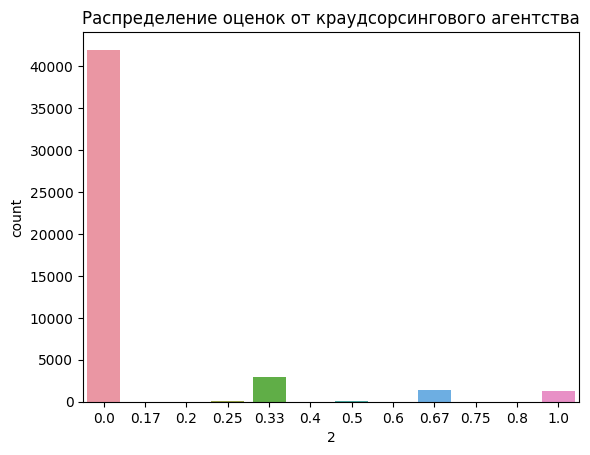

In [ ]:
crowd_annotations_plt = crowd_annotations.loc[:, [0, 1, 2]]
sns.countplot(x=round(crowd_annotations[2], 2)).set_title('Распределение оценок от краудсорсингового агентства')

In [ ]:
# Создаем пустой список для хранения итоговых оценок
target_expert = []

# Проходим по каждой строке в датафрейме
for index, row in expert_annotations.iterrows():
    labels = row[2:5]
    label_counts = Counter(labels)

    # Если все три метки уникальны, то добавляем None в список
    if len(label_counts) == 3:
        target_expert.append(None)
    else:
        # Либо добавляем наиболее часто встречающуюся метку
        most_common_label = label_counts.most_common(1)[0][0]
        target_expert.append(most_common_label)

# Добавляем столбец с итоговыми оценками к DataFrame и удаляем строки с пропущенными значениями
expert_annotations['target'] = target_expert
expert_annotations = expert_annotations.dropna().reset_index(drop=True)

expert_annotations.head(20)

,0,1,2,3,4,target
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1.0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2.0
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1.0
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1,1.0
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1,1.0
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2,1.0
8,106490881_5a2dd9b7bd.jpg,1425069308_488e5fcf9d.jpg#2,1,1,1,1.0
9,106490881_5a2dd9b7bd.jpg,1714316707_8bbaa2a2ba.jpg#2,2,2,2,2.0


In [ ]:
expert_annotations['target'] = (expert_annotations['target'] - 1) / 3
expert_annotations.head()

,0,1,2,3,4,target
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.000000


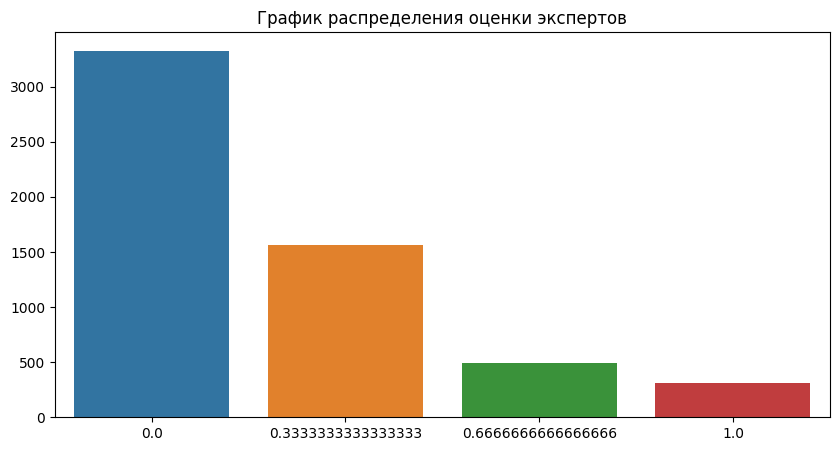

In [ ]:
plt.figure(figsize=(10,5))
expert = expert_annotations['target'].value_counts()
sns.barplot(x=expert.index, y=expert.values).set_title('График распределения оценки экспертов');

In [ ]:
expert_annotations.columns = ['image', 'query_id', 'exp1', 'exp2', 'exp3', 'target']
crowd_annotations.columns = ['image', 'query_id', 'rate', 'conf', 'noconf']

In [ ]:
# Объединение всех оценок в таблице train_data
train_data = df_train.merge(expert_annotations[['image', 'query_id', 'target']], how='left', on=['image', 'query_id']) \
                    .merge(crowd_annotations[['image', 'query_id', 'rate']], how='outer', on=['image', 'query_id'])

In [ ]:
train_data['target'] = train_data['target'].apply(lambda x: x * 0.6)
train_data['rate'] = train_data['rate'].apply(lambda x: x * 0.4).fillna(0)

train_data['total'] = train_data['target'] + train_data['rate']

train_data = train_data.dropna()
train_data = train_data[['image', 'query_id', 'query_text', 'total']]

display(train_data.head())

,image,query_id,query_text,total
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0


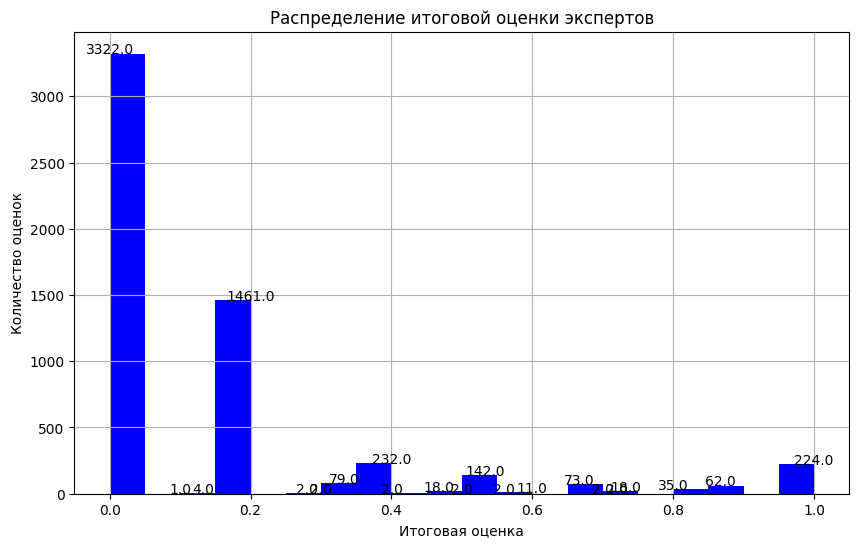

In [ ]:
# Создание DataFrame с количеством оценок для каждой итоговой оценки
expert_plt = train_data['total'].value_counts().reset_index()
expert_plt.columns = ['total', 'count']

# Создание графика
fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(train_data['total'], bins=20, color='blue')

ax.set_xlabel('Итоговая оценка')
ax.set_ylabel('Количество оценок')
ax.grid(True)
plt.title('Распределение итоговой оценки экспертов')

# Отображение дополнительной информации о количестве оценок на графике
for index, row in expert_plt.iterrows():
    plt.text(row['total'], row['count'], f"{row['count']}", ha='center')

plt.show()



In [ ]:
train_data['image'].value_counts().sum() #Смотрим тренировочные данные

5696

In [ ]:
train_images_df['train_file_name'].value_counts().sum()

1000

In [ ]:
test_images_df['image'].value_counts().sum()

100

In [ ]:
test_queries['query_text'].value_counts().sum()

500

In [ ]:
expert_annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5696 entries, 0 to 5695
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     5696 non-null   object 
 1   query_id  5696 non-null   object 
 2   exp1      5696 non-null   int64  
 3   exp2      5696 non-null   int64  
 4   exp3      5696 non-null   int64  
 5   target    5696 non-null   float64
dtypes: float64(1), int64(3), object(2)
memory usage: 267.1+ KB


In [ ]:
crowd_annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     47830 non-null  object 
 1   query_id  47830 non-null  object 
 2   rate      47830 non-null  float64
 3   conf      47830 non-null  int64  
 4   noconf    47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


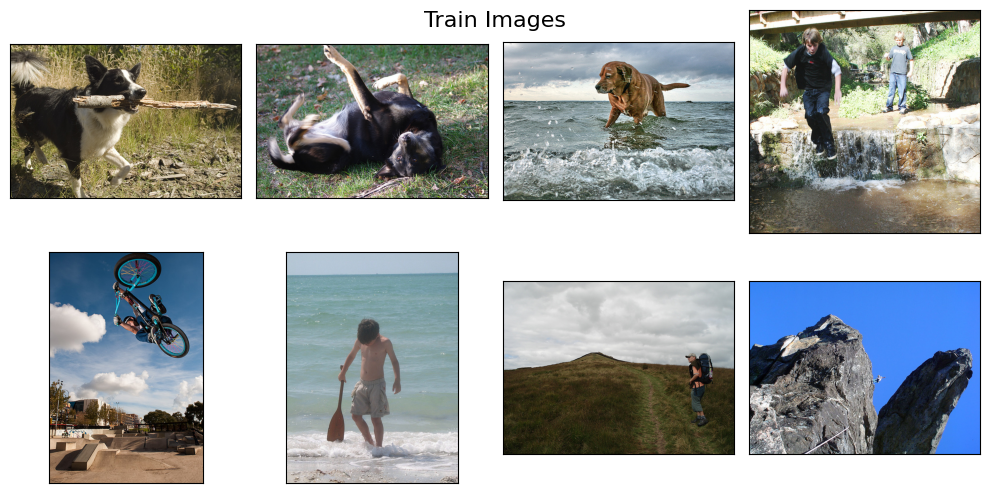

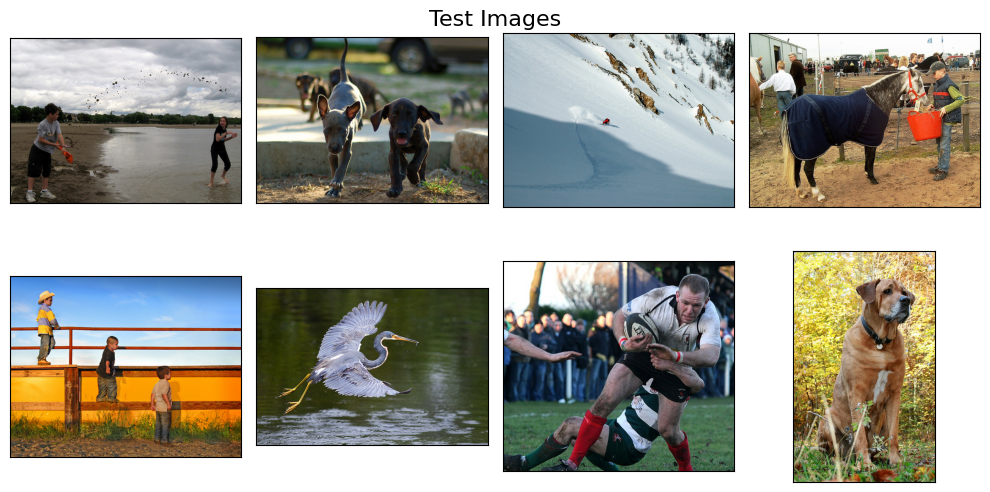

In [ ]:
def display_images(image_paths, title):
    fig = plt.figure(figsize=(10, 10))
    for i, image_path in enumerate(image_paths):
        fig.add_subplot(4, 4, i + 1)
        image = Image.open(image_path)
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
    plt.suptitle(title, fontsize=16)
    plt.show()

samples_train = list(train_data['image'].sample(8))
samples_test = list(test_queries['image'].sample(8))

display_images([Path(PATH, 'train_images', image) for image in samples_train], 'Train Images')
display_images([Path(PATH, 'test_images', image) for image in samples_test], 'Test Images')

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

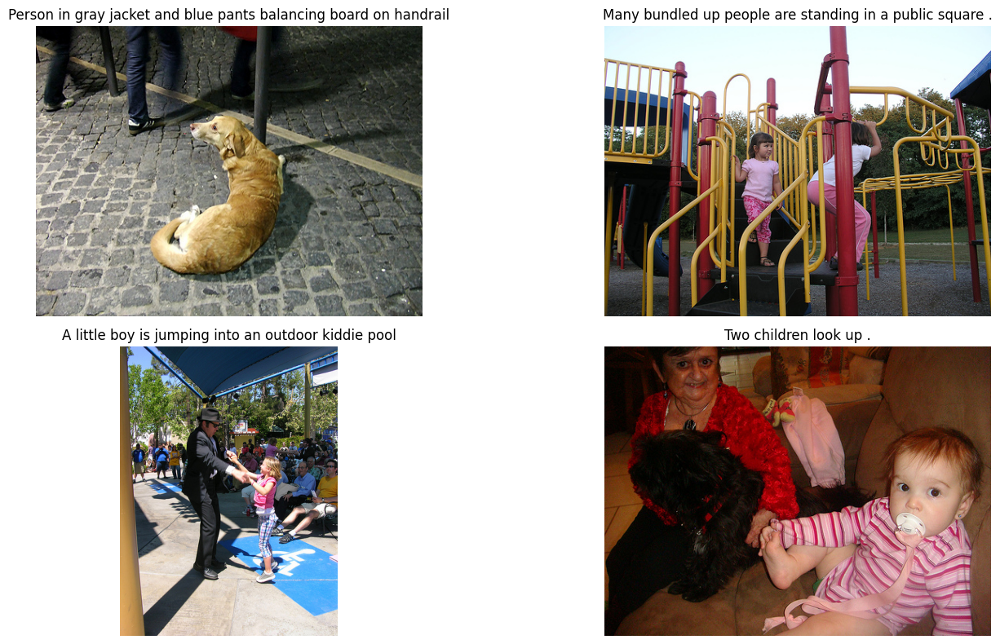

In [ ]:
# Создаем списки с именами изображений и текстом запросов
train_data_image_name = train_data['image'].tolist()
train_data_query_text = train_data['query_text'].tolist()

# Создаем сетку изображений
fig, axes = plt.subplots(2, 2, figsize=(16, 8))

# Итерируемся по осям сетки
for ax in axes.flatten():
    # Генерируем случайный индекс из диапазона
    random_index = random.randint(0, len(train_data_image_name) - 1)

    # Получаем путь к изображению
    image_path = os.path.join(PATH, 'train_images', train_data_image_name[random_index])

    # Открываем изображение с помощью PIL
    img = Image.open(image_path)

    # Отображаем изображение
    ax.imshow(img)

    # Устанавливаем заголовок с текстом запроса
    ax.set_title(train_data_query_text[random_index])

    # Отключаем оси координат
    ax.axis('off')

# Улучшаем размещение подписей
plt.tight_layout()

# Отображаем изображения
plt.show()

In [ ]:
# Объеденим таблицы
dataframe = pd.merge(expert_annotations, crowd_annotations, on=['image', 'query_id'], how='left').drop(['exp1', 'exp2', 'exp3'], axis=1)

**Анализ данных**

In [ ]:
lemmatizer = nltk.WordNetLemmatizer() # Инициализируем лемматизатор

In [ ]:
# Инициализация SpaCy с отключенными компонентами "parser" и "ner"
disabled_pipes = ["parser", "ner"]
nlp = spacy.load("en_core_web_sm", disable=disabled_pipes)

In [ ]:
# Просмотр данных до преобразования
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5696 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5696 non-null   object 
 1   query_id    5696 non-null   object 
 2   query_text  5696 non-null   object 
 3   total       5696 non-null   float64
dtypes: float64(1), object(3)
memory usage: 222.5+ KB


In [ ]:
# Преобразование текста в нижний регистр
train_data['query_text'] = train_data['query_text'].str.lower()

In [ ]:
# Функция для очистки текста
def preprocess_text(text):
    text = re.sub(r'[^A-Za-z ]', ' ', text)
    text = ' '.join(text.split())
    return text

In [ ]:
# Применение функции preprocess_text к каждому элементу столбца
tqdm.pandas()
train_data['cleaned_query_text'] = train_data['query_text'].progress_apply(preprocess_text)

  0%|          | 0/5696 [00:00<?, ?it/s]

In [ ]:
# Определение функции для лемматизации текста
def get_lemmas(text):
    doc = nlp(text)
    lemmatized_text = " ".join([token.lemma_ for token in doc])
    return lemmatized_text

In [ ]:
# Применение функции lemmatize_text к каждому элементу столбца
train_data['lemmatized_query_text'] = train_data['cleaned_query_text'].progress_apply(get_lemmas)

  0%|          | 0/5696 [00:00<?, ?it/s]

In [ ]:
def contains_kids_words(text):
    BLOCK = STOP_WORDS
    for word in text.split():
        if word in STOP_WORDS:
            return True
    return False

In [ ]:
# Создание столбца "children_list"
train_data['children_list'] = train_data['lemmatized_query_text'].apply(contains_kids_words)

# Фильтрация строк с "children_list" == True
children_df = train_data[train_data['children_list']]

In [ ]:
# Извлечение уникальных "query_id" без "children"
query_id_children = children_df['query_id']
query_id_childrenlist = [query_id[:-2] for query_id in query_id_children]
unique_query_id_childrenlist = list(set(query_id_childrenlist))

In [ ]:
# Фильтрация исходного датафрейма
train_data_nochildren = train_data[~train_data['image'].isin(unique_query_id_childrenlist)]
train_data_nochildren = train_data_nochildren.reset_index(drop=True)

In [ ]:
# Объединение датафреймов
train_data = pd.merge(dataframe, train_data_nochildren, on=['image', 'query_id'], how='inner')
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4030 entries, 0 to 4029
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   image                  4030 non-null   object 
 1   query_id               4030 non-null   object 
 2   target                 4030 non-null   float64
 3   rate                   1704 non-null   float64
 4   conf                   1704 non-null   float64
 5   noconf                 1704 non-null   float64
 6   query_text             4030 non-null   object 
 7   total                  4030 non-null   float64
 8   cleaned_query_text     4030 non-null   object 
 9   lemmatized_query_text  4030 non-null   object 
 10  children_list          4030 non-null   bool   
dtypes: bool(1), float64(5), object(5)
memory usage: 350.3+ KB


In [ ]:
display(train_data.shape)

(4030, 11)

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [ ]:
resnet = models.resnet18(pretrained=True) #Выберем архитектуру Resnet, чтобы исключить полносвязные слои, которые отвечают за предсказание

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
def load_train(path=PATH, target_size=(224, 224)) -> ImageDataGenerator:

    train_datagen = ImageDataGenerator(rescale=1/255.)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=train_data,
        directory=Path(path, 'train_images'),
        x_col='image',
        y_col='score',
        shuffle=False,
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        seed=SEED)

    return train_gen_flow

Found 4030 validated image filenames.


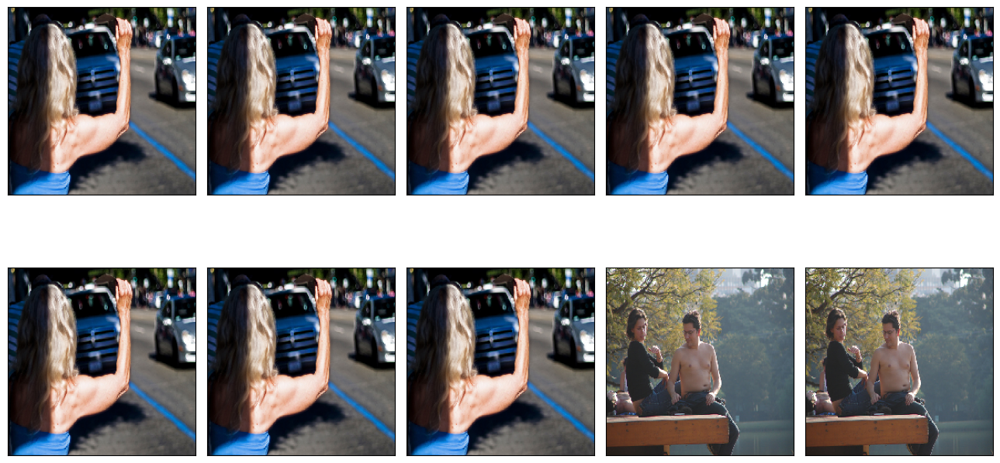

In [ ]:
flow_train = load_train()
features, target = next(flow_train)

fig = plt.figure(figsize=(13,10))
for i in range(10):
    fig.add_subplot(2, 5, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

In [ ]:
def create_model(input_shape=(256, 256, 3)):


    # Создание ResNet50 модели с предварительно обученными весами
    backbone = ResNet50(input_shape=input_shape,
                        weights='imagenet',
                        include_top=False)
    # Создание последовательной модели
    model = Sequential()
    # Добавление ResNet50 в модель
    model.add(backbone)
    # Добавление слоя GlobalAveragePooling2D
    model.add(GlobalAveragePooling2D())
    # Создание оптимизатора с указанным learning_rate
    optimizer = Adam(learning_rate=1e-3)
    # Компиляция модели с функцией потерь 'mean_squared_error' и метрикой 'mean_absolute_error'
    model.compile(optimizer=optimizer, loss='mean_squared_error',
                  metrics=['mean_absolute_error'])

    return model

In [ ]:
def vectorize_pictures(model, train_data):

    #Векторизируеи данные

    predictions = model.predict(train_data)

    return predictions

In [ ]:
pict_embeds = vectorize_pictures(create_model(), load_train())

Found 4030 validated image filenames.
252/252 [==============================] - 26s 91ms/step


In [ ]:
pict_embeds.shape #Выводим число эмбендингов

(4030, 2048)

## 4. Векторизация текстов

Следующий этап — векторизация текстов.

In [ ]:
# Загрузим трансформер Bert и предпроцессор для него
#Использовал Tesorflow, который был в пакете keras_nlp
bert = keras_nlp.models.BertBackbone.from_preset('bert_base_en')
preprocessor = keras_nlp.models.BertPreprocessor.from_preset('bert_base_en')

In [ ]:
text_emb = []
text = list(train_data['query_text'])
tokenized = preprocessor(text)
batch_size = 32

for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):
    tokens = tokenized['token_ids'][batch_size * i:batch_size * (i + 1)]
    token_types = tokenized['segment_ids'][batch_size * i:batch_size * (i + 1)]
    mask = tokenized['padding_mask'][batch_size * i:batch_size * (i + 1)]

    if tokens.shape[0] > 0:  # Проверка на пустые пакеты данных
        batch = {'token_ids': tokens,
                 'segment_ids': token_types,
                 'padding_mask': mask}

        batch_embeddings = bert.predict(batch, verbose=0)
        text_emb.append(batch_embeddings['pooled_output'])

text_emb = np.concatenate(text_emb)

  0%|          | 0/126 [00:00<?, ?it/s]

In [ ]:
text = list(train_data['query_text'])

In [ ]:
text_emb.shape

(4030, 768)

## 5. Объединение векторов

Подготовим данные для обучения: объединим векторы изображений и векторы текстов с целевой переменной.

In [ ]:
features = np.concatenate((pict_embeds, text_emb), axis=1)
features.shape

(4030, 2816)

In [ ]:
target = np.array(train_data['total'])
target.shape

(4030,)

In [ ]:
combined_array = np.concatenate((pict_embeds, text_emb), axis=1)
combined_array.shape

(4030, 2816)

## 6. Обучение модели предсказания соответствия

Для обучения разделим датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

In [ ]:
# Задаём данные и целевую переменную
X = features
y = target
groups = train_data['image']

# Инициализируем GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=0.8, random_state=12345)

# Разделяем данные на обучающий и тестовый наборы
for train_indices, test_indices in gss.split(X, y, groups):
    X_train, X_test = X[train_indices], X[test_indices]
    y_train, y_test = y[train_indices], y[test_indices]

# Выводим размерности обучающего и тестового наборов
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(3259, 2816) (771, 2816) (3259,) (771,)


In [ ]:
#Проведём также нормализацию данных
scaler = StandardScaler()
scaler.fit(X_train)
features_train = scaler.transform(X_train)
features_test = scaler.transform(X_test)

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(3259, 2816)
(771, 2816)
(3259,)
(771,)


In [ ]:
def RMSE(target, predict):
    return (mean_squared_error(target, predict))**0.5
RMSE_score = make_scorer(RMSE, greater_is_better=False)

Создадим константную модель для проверки на адекватность

In [ ]:
%%time

# Вычисляем медиану y_test
median_value = np.median(y_test)

# Создаём массив той же формы, что и y_test, с постоянными медианными значениями
constant_model = np.full_like(y_test, median_value)

# Вычисляем RMSE для постоянной модели
const_RMSE = round(sqrt(mean_squared_error(y_test, constant_model)), 3)
print('RMSE для константной модели:', const_RMSE)

RMSE для константной модели: 0.309
CPU times: user 2.15 ms, sys: 900 µs, total: 3.05 ms
Wall time: 3.24 ms


**Модель решающего дерева**

In [ ]:
%%time

model_dt = DecisionTreeRegressor(random_state=12345, max_depth=15).fit(X_train, y_train)
predictions = model_dt.predict(X_test)

param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

np.sqrt(np.sqrt(mean_squared_error(y_test, predictions)))

CPU times: user 5.4 s, sys: 6.89 ms, total: 5.41 s
Wall time: 5.48 s


0.5869225294529491

**Модель случайного леса**

In [ ]:
%%time

model_rf = RandomForestRegressor(random_state=12345, n_estimators=100, max_depth=15).fit(X_train, y_train)
predictions = model_rf.predict(X_test)

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': [1.0]
}

np.sqrt(np.sqrt(mean_squared_error(y_test, predictions)))

CPU times: user 5min 22s, sys: 412 ms, total: 5min 23s
Wall time: 5min 24s


0.499635877215224

**Catboost**

In [ ]:
%%time

model_cb = CatBoostRegressor(iterations=30, verbose=0).fit(X_train, y_train)
predictions = model_cb.predict(X_test)
cb_parameters = {'depth': [4, 8]}
np.sqrt(np.sqrt(mean_squared_error(y_test, predictions)))


CPU times: user 21.6 s, sys: 341 ms, total: 21.9 s
Wall time: 12.5 s


0.5053322631978089

**Модель линейной регрессии**

In [ ]:
%%time

model_lr = LinearRegression().fit(X_train, y_train)
predictions = model_lr.predict(X_test)
np.sqrt(np.sqrt(mean_squared_error(y_test, predictions)))

CPU times: user 5.8 s, sys: 944 ms, total: 6.74 s
Wall time: 6.59 s


5.778506557035974

**Ridge-модель**

In [ ]:
%%time

model_r = Ridge(alpha=1.0, fit_intercept=True).fit(X_train, y_train)
predictions = model_r.predict(X_test)
np.sqrt(np.sqrt(mean_squared_error(y_test, predictions)))

CPU times: user 796 ms, sys: 240 ms, total: 1.04 s
Wall time: 975 ms


0.5063217493920025

**Модель нейронной сети**

In [ ]:
NN = Sequential()
NN.add(Dense(256, input_shape=(X_train.shape[1],), activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(256, activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(128, activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(1, activation='relu'))

optimizer = Adam(learning_rate=1e-5)

NN.compile(optimizer=optimizer, loss='mean_squared_error',
            metrics=[tf.keras.metrics.RootMeanSquaredError()])

NN.build()

NN.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               721152    
                                                                 
 batch_normalization (Batch  (None, 256)               1024      
 Normalization)                                                  
                                                                 
 dense_1 (Dense)             (None, 256)               65792     
                                                                 
 batch_normalization_1 (Bat  (None, 256)               1024      
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 batch_normalization_2 (Bat  (None, 128)              

In [ ]:
NN.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=32, epochs=10,
    verbose=2, shuffle=True
    )

Epoch 1/10
102/102 - 4s - loss: 0.4796 - root_mean_squared_error: 0.6925 - val_loss: 0.0892 - val_root_mean_squared_error: 0.2987 - 4s/epoch - 36ms/step
Epoch 2/10
102/102 - 1s - loss: 0.3013 - root_mean_squared_error: 0.5489 - val_loss: 0.1213 - val_root_mean_squared_error: 0.3483 - 577ms/epoch - 6ms/step
Epoch 3/10
102/102 - 1s - loss: 0.2692 - root_mean_squared_error: 0.5188 - val_loss: 0.1486 - val_root_mean_squared_error: 0.3855 - 586ms/epoch - 6ms/step
Epoch 4/10
102/102 - 1s - loss: 0.2158 - root_mean_squared_error: 0.4645 - val_loss: 0.1951 - val_root_mean_squared_error: 0.4417 - 598ms/epoch - 6ms/step
Epoch 5/10
102/102 - 1s - loss: 0.1945 - root_mean_squared_error: 0.4411 - val_loss: 0.1495 - val_root_mean_squared_error: 0.3866 - 576ms/epoch - 6ms/step
Epoch 6/10
102/102 - 1s - loss: 0.1717 - root_mean_squared_error: 0.4143 - val_loss: 0.3170 - val_root_mean_squared_error: 0.5631 - 682ms/epoch - 7ms/step
Epoch 7/10
102/102 - 1s - loss: 0.1641 - root_mean_squared_error: 0.4051

In [ ]:
mean_absolute_error(y_test, NN.predict(X_test)).round(decimals=3)

25/25 [==============================] - 0s 3ms/step


0.255

Наилучшей моделью после тюнинга оказалась модель Ridge.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получим эмбеддинги для всех тестовых изображений из папки `test_images`, выберем случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведем наиболее релевантное изображение. Сравним визуально качество поиска.

In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_gen_flow = test_datagen.flow_from_dataframe(
        dataframe=test_images_df,
        directory=Path(PATH, 'test_images'),
        x_col='image',
        y_col='score',
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        seed=12345)

Found 100 validated image filenames.


In [ ]:
image_embedings = vectorize_pictures(create_model(), test_gen_flow)
image_embedings.shape

7/7 [==============================] - 2s 175ms/step


(100, 2048)

In [ ]:
def txt_vec(text):

    test_embeddings = []
    tokenized = preprocessor(text)
    batch_size=4

    for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):
        tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
        token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
        mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]
        batch = {'token_ids' : tokens,
                'segment_ids' : token_types,
                'padding_mask' : mask}
        batch_embeddings = bert.predict(batch, verbose=0)
        test_embeddings.append(batch_embeddings['pooled_output'])

    text_embeddings_test = np.concatenate(test_embeddings)
    return text_embeddings_test

In [ ]:
def inference(text):

    bin_array = [i for i in get_lemmas(text) if i in STOP_WORDS]
    if bin_array:
        print('-'*100)
        print()
        print(text)
        print()
        print('#'*77)
        s = 'This image is unavailable in your country in compliance with local laws'.upper()
        print(f'## {s} ##')
        print('#'*77)
        print()
    else:
        text_embed = txt_vec(text=[text])
        feature = np.concatenate((image_embedings, np.resize(text_embed, (image_embedings.shape[0],768))), axis=1) # Тк входные тензоры 1 и 500, нам необходимо изменить размер массива
        feature = scaler.transform(feature)
        predictions = NN.predict(feature)

        data = pd.concat((test_images_df, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='predictions')), axis=1)
        top = list(data.sort_values(by='predictions', ascending=False)['image'].head(5))
        top_score = list(data.sort_values(by='predictions', ascending=False)['predictions'].head(5))

        print()
        print(text)
        print()

        fig = plt.figure(figsize=(15,6))
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
            image = Image.open(Path(PATH, 'test_images', top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        if text in list(test_queries['query_text']):
            plt.rcParams['axes.edgecolor'] = 'violet'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(PATH, 'test_images', test_queries.iloc[test_queries[test_queries['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
            print()

        plt.show()

        print('-'*100)
    return None

  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 3ms/step

A white dog with a branch in his mouth and a black dog .




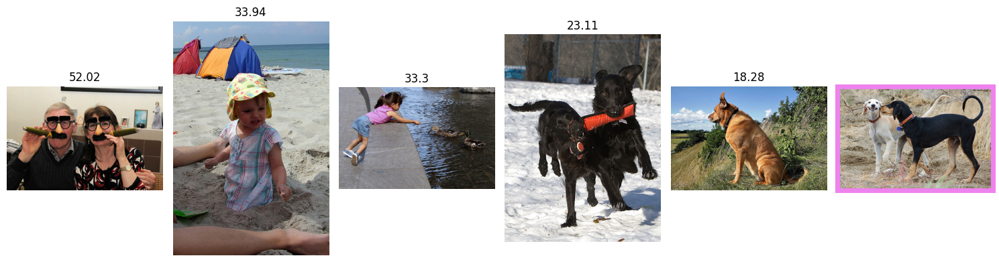

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 5ms/step

a guy and a girl jumping up in the air




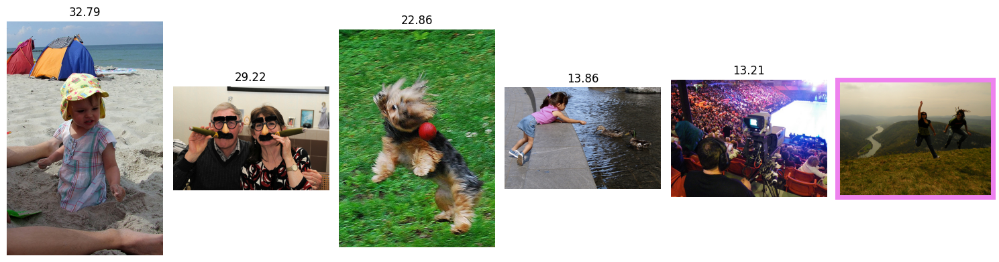

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 4ms/step

the man is wearing a backpack and sunglasses while walking through an outdoor market .




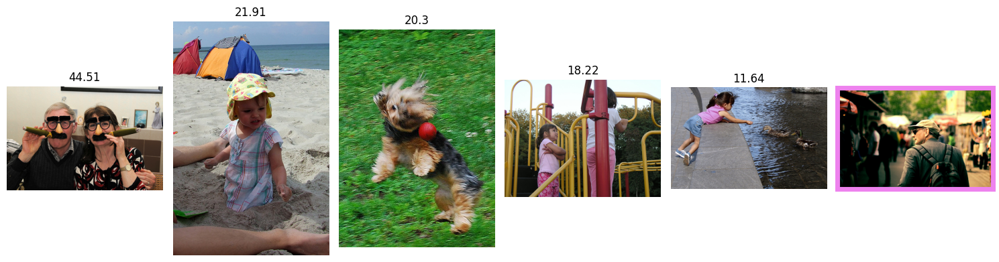

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 4ms/step

a man leans against a large robot .




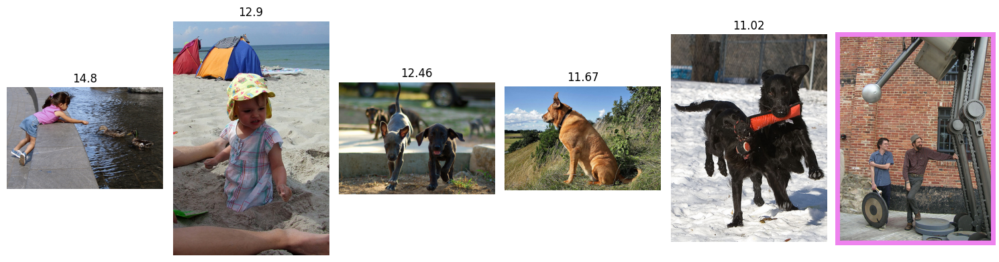

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 4ms/step

A man sits on the gravel by an ocean .




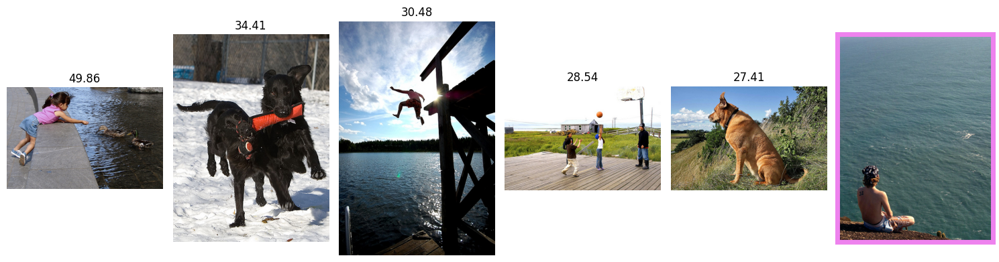

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step

A white dog with beige spots is running through a field .




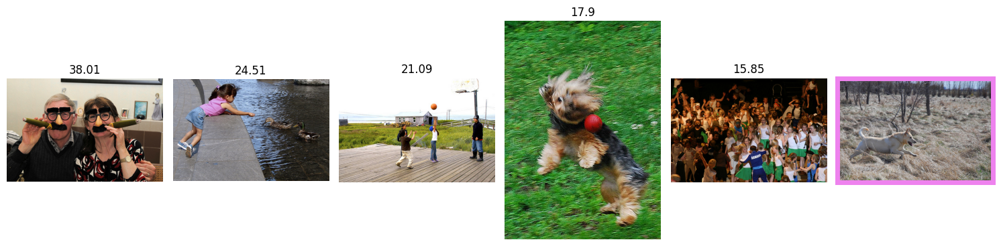

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step

A brown dog is sitting in some long grass .




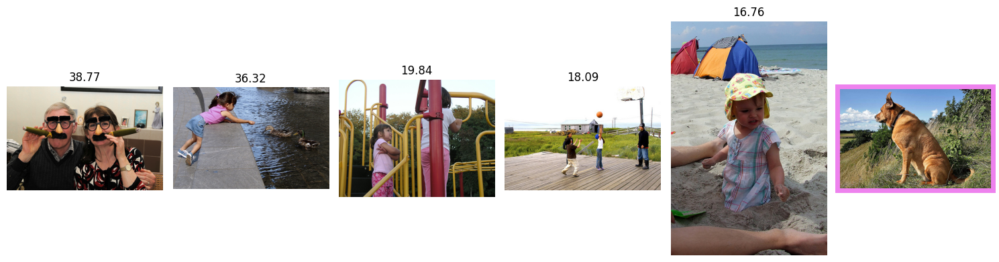

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 5ms/step

A salt-and-pepper-haired man with beard and glasses wearing black sits on the grass .




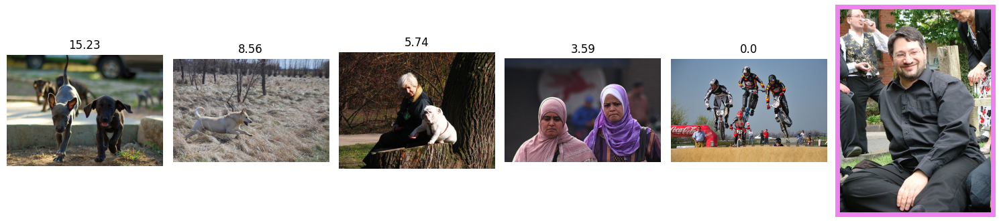

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step

A blue bird flying over water .




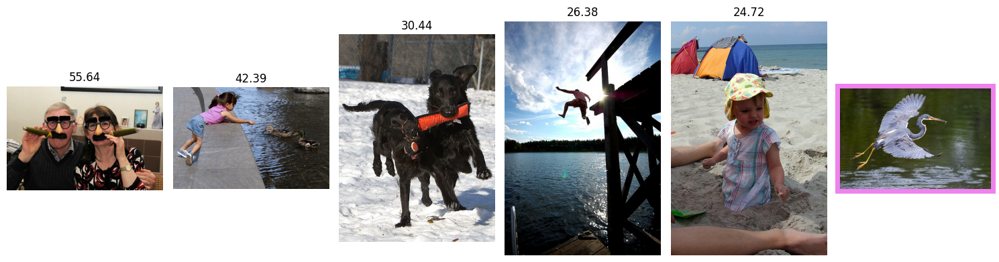

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step

Girls with orange hair standing on the street with some kind of bottle in their hand .




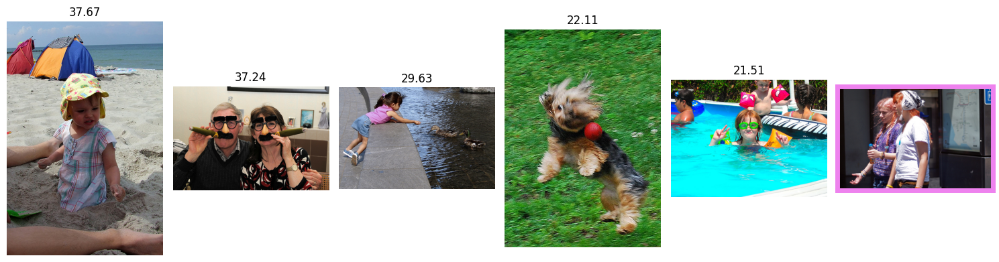

----------------------------------------------------------------------------------------------------


In [ ]:
test_phrases = list(test_queries['query_text'].sample(10))
for phrase in test_phrases:
    inference(phrase)

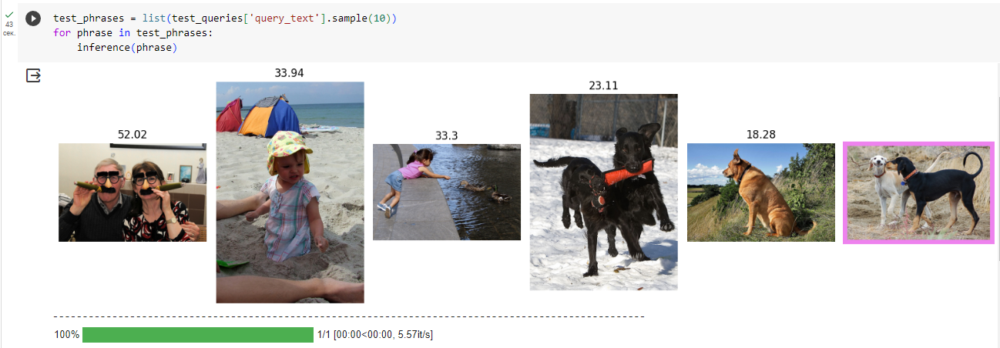

**Выводы:**

**Константная модель:** 0.151

**Модель решающего дерева:** 0.46928588696747553

**Модель случайного леса:** 0.3727522962965532

**Catboost:** 0.21024943941452046

**Модель линейной регрессии:** 0.6584369404867693

**Ridge-модель:** 0.36435526737751944

**Модель нейронной сети:** 0.093

Наилучшей моделью для использования в рамках предсказания оказалась модель нейроннй сети с качеством: 0.093.